## Importing Libraries and Dataset

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold, cross_val_score, permutation_test_score
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, roc_curve
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
from lightgbm import LGBMClassifier
from imblearn.under_sampling import RandomUnderSampler, TomekLinks
from imblearn.over_sampling import SMOTE, SMOTENC, RandomOverSampler
from imblearn.combine import SMOTETomek
from scipy.stats import uniform, randint
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.utils import resample
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [ ]:
!pip install skater

In [ ]:
!pip install shap

     |████████████████████████████████| 327kB 2.8MB/s 
  Created wheel for shap: filename=shap-0.36.0-cp36-cp36m-linux_x86_64.whl size=456467 sha256=14df80bc1fdbe4d49ca5c800e0ab960437ddfc7ac7a59db85e827f717019f038
  Stored in directory: /root/.cache/pip/wheels/fb/15/e1/8f61106790da27e0765aaa6e664550ca2c50ea339099e799f4
Successfully built shap


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/My Drive/PGPDSE/Capstone/CSV Files/Diabetes_Preprocessed_Before_Feature_Selection.csv')
df.head()

,race,gender,age,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,diag_1,diag_2,diag_3,number_diagnoses,max_glu_serum,A1Cresult,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,readmitted,preceding_year_visits,number_changes,insulin_treatment
0,Caucasian,0,5,Not Available,Referral,1,41,0,1,Diabetes,Not Required,Not Required,1,None,None,-2,-2,-2,-2,-2,-2,-2,-2,0,0,0,0,no_med
1,Caucasian,0,15,Discharged to home,Emergency,3,59,0,18,"Endocrine, Nutritional, Metabolic, Immunity",Diabetes,"Endocrine, Nutritional, Metabolic, Immunity",9,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
2,AfricanAmerican,0,25,Discharged to home,Emergency,2,11,5,13,"Pregnancy, Childbirth",Diabetes,External causes of injury,6,None,None,-2,-2,-2,0,-2,-2,-2,-2,1,0,3,0,other_meds
3,Caucasian,1,35,Discharged to home,Emergency,2,44,1,16,Infectious and Parasitic,Diabetes,Circulatory,7,None,None,-2,-2,-2,-2,-2,-2,-2,1,1,0,0,1,insulin_only
4,Caucasian,1,45,Discharged to home,Emergency,1,51,0,8,Neoplasms,Neoplasms,Diabetes,5,None,None,-2,-2,-2,0,-2,-2,-2,0,1,0,0,0,insulin_combo


In [ ]:
df.shape

(97070, 28)

In [ ]:
X = df.drop(['readmitted'], 1)
y = df['readmitted']
X_dum = pd.get_dummies(X, drop_first = True)
X_train, X_test, y_train, y_test = train_test_split(X_dum, y, test_size = 0.3, random_state = 0, stratify = y)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((67949, 95), (29121, 95), (67949,), (29121,))

In [ ]:
X_train.head()

,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_diagnoses,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,preceding_year_visits,number_changes,race_Asian,race_Caucasian,race_Hispanic,race_Other,discharge_disposition_id_Discharged to home with home health service,discharge_disposition_id_Left AMA,discharge_disposition_id_Not Available,discharge_disposition_id_Still patient/referred to this institution,discharge_disposition_id_Transferred to another medical facility,admission_source_id_Not Available,admission_source_id_Referral,admission_source_id_Transferred from another health care facility,diag_1_Circulatory,diag_1_Congenital Anomalies,diag_1_Diabetes,diag_1_Digestive,"diag_1_Endocrine, Nutritional, Metabolic, Immunity",diag_1_External causes of injury,diag_1_Genitourinary,diag_1_Infectious and Parasitic,diag_1_Injury and Poisoning,diag_1_Mental Disorders,diag_1_Musculoskeletal System and Connective Tissue,diag_1_Neoplasms,diag_1_Nervous,diag_1_Other Symptoms,"diag_1_Pregnancy, Childbirth",diag_1_Respiratory,diag_1_Sense Organs,diag_1_Skin and Subcutaneous Tissue,diag_2_Circulatory,diag_2_Congenital Anomalies,diag_2_Diabetes,diag_2_Digestive,"diag_2_Endocrine, Nutritional, Metabolic, Immunity",diag_2_External causes of injury,diag_2_Genitourinary,diag_2_Infectious and Parasitic,diag_2_Injury and Poisoning,diag_2_Mental Disorders,diag_2_Musculoskeletal System and Connective Tissue,diag_2_Neoplasms,diag_2_Nervous,diag_2_Not Required,diag_2_Other Symptoms,"diag_2_Pregnancy, Childbirth",diag_2_Respiratory,diag_2_Sense Organs,diag_2_Skin and Subcutaneous Tissue,diag_3_Circulatory,diag_3_Congenital Anomalies,diag_3_Diabetes,diag_3_Digestive,"diag_3_Endocrine, Nutritional, Metabolic, Immunity",diag_3_External causes of injury,diag_3_Genitourinary,diag_3_Infectious and Parasitic,diag_3_Injury and Poisoning,diag_3_Mental Disorders,diag_3_Musculoskeletal System and Connective Tissue,diag_3_Neoplasms,diag_3_Nervous,diag_3_Not Required,diag_3_Other Symptoms,"diag_3_Pregnancy, Childbirth",diag_3_Respiratory,diag_3_Sense Organs,diag_3_Skin and Subcutaneous Tissue,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,insulin_treatment_insulin_only,insulin_treatment_no_med,insulin_treatment_other_meds
73921,0,45,6,53,1,29,8,-1,-2,0,-2,-2,-2,-2,-1,1,2,2,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0
96919,0,85,2,43,0,24,7,-2,-2,-2,0,-2,-2,-2,0,1,3,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
25853,1,65,1,1,1,17,3,-2,-2,-2,-2,-2,-2,-2,-2,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0
31598,1,85,5,42,0,20,9,-2,-2,-2,1,-2,-2,-2,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
24086,1,65,3,45,2,17,8,-2,-2,-2,-2,-2,-2,-2,-2,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0


In [ ]:
X_train = X_train.reset_index(drop = True)
X_test = X_test.reset_index(drop = True)
y_train = y_train.reset_index(drop = True)
y_test = y_test.reset_index(drop = True)

## Building Model and Making Predictions

In [ ]:
model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True, silent = False,
                       colsample_bytree= 0.7, learning_rate= 0.055499999999999994, max_depth= 309, min_child_samples= 28,
                       n_estimators= 180, num_leaves= 31, reg_alpha= 50, reg_lambda= 5, subsample= 0.7, subsample_freq= 2)

In [ ]:
start_time = time.time()
model.fit(X_train, y_train)
end_time = time.time()
print("Training Time:", end_time - start_time)
y_train_pred = model.predict(X_train)
y_train_prob = model.predict_proba(X_train)[:, 1]
start_time = time.time()
y_test_pred = model.predict(X_test)
end_time = time.time()
print("Prediction Time:", end_time - start_time)
y_test_prob = model.predict_proba(X_test)[:, 1]
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Training Time: 2.5391366481781006
Prediction Time: 0.2857027053833008
Train Accuracy Score: 0.6254838187464128
Train Confusion Matrix:
 [[37360 22805]
 [ 2643  5141]] 

Train F1 Score: 0.28776938147215225
Train Precision Score: 0.18396192657267588
Train Recall Score: 0.6604573484069887
Train ROC_AUC Score: 0.6970697072003686

Test Accuracy Score: 0.6207891212527042
Test Confusion Matrix:
 [[16016  9769]
 [ 1274  2062]] 

Test F1 Score: 0.27190611195358344
Test Precision Score: 0.17428788775251458
Test Recall Score: 0.61810551558753
Test ROC_AUC Score: 0.6658753916006229


## ROC Curve

Best Threshold=0.495109, G-Mean=0.641


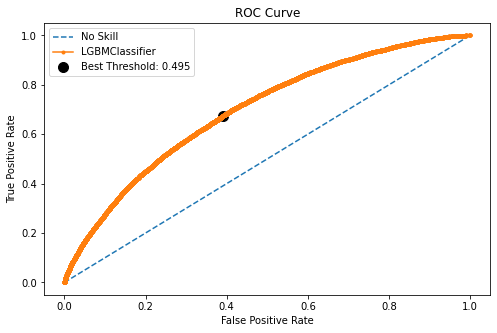

In [ ]:
plt.figure(figsize = (8, 5))
# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_train, y_train_prob)
# calculate the g-mean for each threshold
gmeans = np.sqrt(tpr * (1-fpr))
# locate the index of the largest g-mean
ix = np.argmax(gmeans)
best_thresh = thresholds[ix]
print('Best Threshold=%f, G-Mean=%.3f' % (best_thresh, gmeans[ix]))
# plot the roc curve for the model
plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr, tpr, marker='.', label='LGBMClassifier')
plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', alpha = 1, edgecolors = 'k', s = 100,
            label='Best Threshold: '+str(round(best_thresh, 3)))
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title("ROC Curve")
plt.legend(loc = 'best')
# show the plot
plt.show()

## Precision Recall Tradeoff

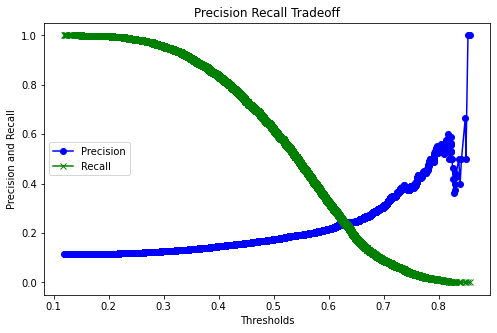

In [ ]:
plt.figure(figsize = (8, 5))
prec, rec, thresh = precision_recall_curve(y_test, y_test_prob)
plt.plot(thresh, prec[1:], marker = 'o', c = 'b', label = 'Precision')
plt.plot(thresh, rec[1:], marker = 'x', c = 'g', label = 'Recall')
plt.legend(loc = 'center left')
plt.xlabel("Thresholds")
plt.ylabel('Precision and Recall')
plt.title('Precision Recall Tradeoff')
plt.show()

In [ ]:
acc = []
f1 = []
prec = []
rec = []
thresh = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.8, 0.85]
for i in thresh:
    pred = (y_test_prob >= i).astype(bool)
    f1.append(f1_score(y_test, pred))
    acc.append(accuracy_score(y_test, pred))
    prec.append(precision_score(y_test, pred))
    rec.append(recall_score(y_test, pred))
res = pd.DataFrame({"Thresholds" : thresh, "Accuracy" : acc, "F1" : f1, "Precision" : prec, "Recall" : rec})
res

,Thresholds,Accuracy,F1,Precision,Recall
0,0.10,0.114591,0.205571,0.114560,1.000000
1,0.15,0.116686,0.205909,0.114774,0.999700
2,0.20,0.130765,0.208004,0.116122,0.996403
3,0.25,0.168538,0.213072,0.119491,0.982614
4,0.30,0.235191,0.222564,0.125948,0.955635
5,0.35,0.319872,0.233751,0.134195,0.905576
6,0.40,0.422444,0.248850,0.146208,0.835132
7,0.45,0.523780,0.260452,0.158407,0.732014
8,0.50,0.620789,0.271906,0.174288,0.618106
9,0.55,0.710106,0.274119,0.192187,0.477818


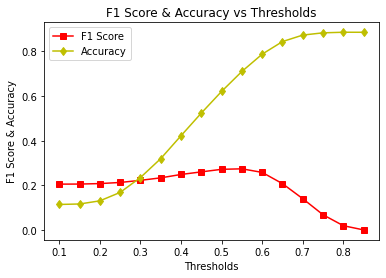

In [ ]:
plt.plot(thresh, f1, marker = 's', c = 'r', label = 'F1 Score')
plt.plot(thresh, acc, marker = 'd', c = 'y', label = 'Accuracy')
plt.xlabel('Thresholds')
plt.ylabel('F1 Score & Accuracy')
plt.title('F1 Score & Accuracy vs Thresholds')
plt.legend(loc = 'best')
plt.show()

## Moving Threshold

In [ ]:
y_train_pred = (y_train_prob >= best_thresh).astype(bool)
y_test_pred = (y_test_prob >= best_thresh).astype(bool)
print("Train Accuracy Score:", accuracy_score(y_train, y_train_pred))
print("Train Confusion Matrix:\n", confusion_matrix(y_train, y_train_pred), '\n')
print("Train F1 Score:", f1_score(y_train, y_train_pred))
print("Train Precision Score:", precision_score(y_train, y_train_pred))
print("Train Recall Score:", recall_score(y_train, y_train_pred))
print("Train ROC_AUC Score:", roc_auc_score(y_train, y_train_prob))
print()
print("Test Accuracy Score:", accuracy_score(y_test, y_test_pred))
print("Test Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred), '\n')
print("Test F1 Score:", f1_score(y_test, y_test_pred))
print("Test Precision Score:", precision_score(y_test, y_test_pred))
print("Test Recall Score:", recall_score(y_test, y_test_pred))
print("Test ROC_AUC Score:", roc_auc_score(y_test, y_test_prob))

Train Accuracy Score: 0.6168744205212733
Train Confusion Matrix:
 [[36668 23497]
 [ 2536  5248]] 

Train F1 Score: 0.28733335158367324
Train Precision Score: 0.18257088189250303
Train Recall Score: 0.6742034943473793
Train ROC_AUC Score: 0.6970697072003686

Test Accuracy Score: 0.6115861405858315
Test Confusion Matrix:
 [[15694 10091]
 [ 1220  2116]] 

Test F1 Score: 0.27227690921958436
Test Precision Score: 0.17334316375849923
Test Recall Score: 0.6342925659472423
Test ROC_AUC Score: 0.6658753916006229


## Feature Importance Plot

In [ ]:
fi_df = pd.DataFrame({'Features' : X_train.columns, 'Importances' : model.feature_importances_}).sort_values(by = 'Importances', ascending = False)
fi_df

,Features,Importances
5,num_medications,660
3,num_lab_procedures,626
2,time_in_hospital,454
1,age,403
16,preceding_year_visits,302
6,number_diagnoses,262
4,num_procedures,234
7,metformin,97
26,discharge_disposition_id_Transferred to anothe...,83
14,insulin,82


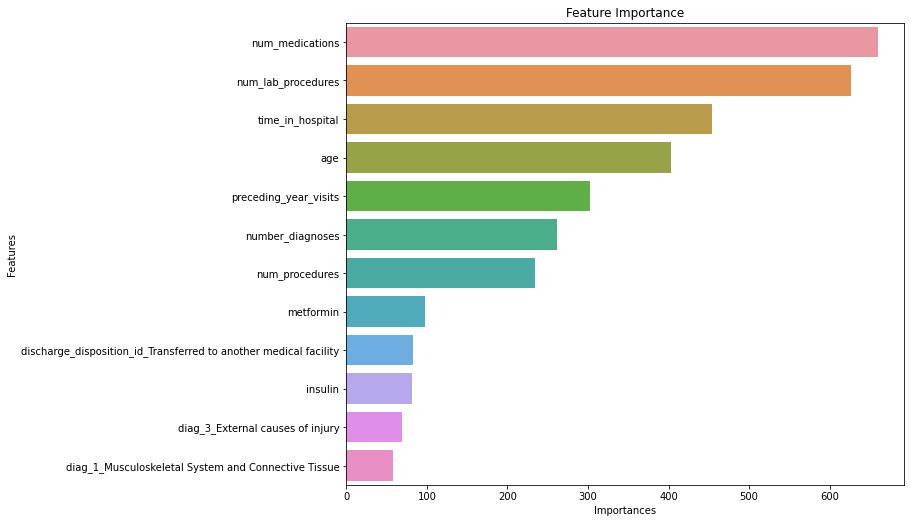

In [ ]:
fig = plt.figure(figsize = (10, 8.5))
sns.barplot(y=fi_df['Features'][:12], 
            x = fi_df['Importances'][:12],
            orient='h')
plt.title("Feature Importance")
plt.show()

## Model Agnostic Interpretation with Skater


In [ ]:
from skater.core.explanations import Interpretation
from skater.model import InMemoryModel

interpreter = Interpretation(training_data=X_train, feature_names=list(X_train.columns))
im_model = InMemoryModel(model.predict_proba, examples=X_train, unique_values=[0, 1], target_names=['Not Readmitted', 'Readmitted < 30 Days'])

### Local Interpretations with Skater

Local Interpretation could be possibly be achieved in two ways. Firstly, one could possibly approximate the behavior of a complex predictive model in the vicinity of a single input using a simple interpretable auxiliary or surrogate model (e.g. Linear Regressor). Secondly, one could use the base estimator to understand the behavior of a single prediction using intuitive approximate functions based on inputs and outputs.

### Local Interpretable Model-Agnostic Explanations(LIME)
LIME is a novel algorithm designed by Riberio Marco, Singh Sameer, Guestrin Carlos to access the behavior of the any base estimator(model) using interpretable surrogate models (e.g. linear classifier/regressor). Such form of comprehensive evaluation helps in generating explanations which are locally faithful but may not align with the global behavior. Basically, LIME explanations are based on local surrogate models. These, surrogate models are interpretable models (like a linear model or decision tree) that are learned on the predictions of the original black box model. But instead of trying to fit a global surrogate model, LIME focuses on fitting local surrogate models to explain why single predictions were made.

The idea is very intuitive. To start with, just try and unlearn what you have done so far! Forget about the training data, forget about how your model works! Think that your model is a black box model with some magic happening inside, where you can input data points and get the models predicted outcomes. You can probe this magic black box as often as you want with inputs and get output predictions.

Now, you main objective is to understand why the machine learning model which you are treating as a magic black box, gave the outcome it produced. LIME tries to do this for you! It tests out what happens to you black box model's predictions when you feed variations or perturbations of your dataset into the black box model. Typically, LIME generates a new dataset consisting of perturbed samples and the associated black box model's predictions. On this dataset LIME then trains an interpretable model weighted by the proximity of the sampled instances to the instance of interest. Following is a standard high-level workflow for this.
 - Choose your instance of interest for which you want to have an explanation of the predictions of your black box model.
 - Perturb your dataset and get the black box predictions for these new points.
 - Weight the new samples by their proximity to the instance of interest.
 - Fit a weighted, interpretable (surrogate) model on the dataset with the variations.
 - Explain prediction by interpreting the local model.
 
We recommend you to read the [LIME chapter](https://christophm.github.io/interpretable-ml-book/lime.html) in Christoph Molnar's excellent book on Model Interpretation which talks about this in detail.

### Explaining Model Predictions with Skater using LIME

Skater can leverage LIME to explain model predictions. Typically, its __`LimeTabularExplainer`__ class helps in explaining predictions on tabular (i.e. matrix) data. For numerical features, it perturbs them by sampling from a Normal(0,1) and doing the inverse operation of mean-centering and scaling, according to the means and stds in the training data. For categorical features, it perturbs by sampling according to the training distribution, and making a binary feature that is 1 when the value is the same as the instance being explained. The __`explain_instance()`__ function generates explanations for a prediction. First, we generate neighborhood data by randomly perturbing features from the instance. We then learn locally weighted linear (surrogate) models on this neighborhood data to explain each of the classes in an interpretable way.

In [ ]:
from skater.core.local_interpretation.lime.lime_tabular import LimeTabularExplainer

model = LGBMClassifier(objective = 'binary', random_state = 0, n_jobs = -1, is_unbalance = True, silent = False,
                       colsample_bytree= 0.7, learning_rate= 0.055499999999999994, max_depth= 309, min_child_samples= 28,
                       n_estimators= 180, num_leaves= 31, reg_alpha= 50, reg_lambda= 5, subsample= 0.7, subsample_freq= 2)
model.fit(X_train.values, y_train)

exp = LimeTabularExplainer(X_test.values, feature_names=list(X_test.columns), 
                           discretize_continuous=True, 
                           class_names=['Not Readmitted', 'Readmitted < 30 Days'])

In [ ]:
y_test

0        0
1        0
2        0
3        0
4        1
        ..
29116    0
29117    0
29118    0
29119    0
29120    1
Name: readmitted, Length: 29121, dtype: int64

In [ ]:
X_test.head()

,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_diagnoses,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,preceding_year_visits,number_changes,race_Asian,race_Caucasian,race_Hispanic,race_Other,discharge_disposition_id_Discharged to home with home health service,discharge_disposition_id_Left AMA,discharge_disposition_id_Not Available,discharge_disposition_id_Still patient/referred to this institution,discharge_disposition_id_Transferred to another medical facility,admission_source_id_Not Available,admission_source_id_Referral,admission_source_id_Transferred from another health care facility,diag_1_Circulatory,diag_1_Congenital Anomalies,diag_1_Diabetes,diag_1_Digestive,"diag_1_Endocrine, Nutritional, Metabolic, Immunity",diag_1_External causes of injury,diag_1_Genitourinary,diag_1_Infectious and Parasitic,diag_1_Injury and Poisoning,diag_1_Mental Disorders,diag_1_Musculoskeletal System and Connective Tissue,diag_1_Neoplasms,diag_1_Nervous,diag_1_Other Symptoms,"diag_1_Pregnancy, Childbirth",diag_1_Respiratory,diag_1_Sense Organs,diag_1_Skin and Subcutaneous Tissue,diag_2_Circulatory,diag_2_Congenital Anomalies,diag_2_Diabetes,diag_2_Digestive,"diag_2_Endocrine, Nutritional, Metabolic, Immunity",diag_2_External causes of injury,diag_2_Genitourinary,diag_2_Infectious and Parasitic,diag_2_Injury and Poisoning,diag_2_Mental Disorders,diag_2_Musculoskeletal System and Connective Tissue,diag_2_Neoplasms,diag_2_Nervous,diag_2_Not Required,diag_2_Other Symptoms,"diag_2_Pregnancy, Childbirth",diag_2_Respiratory,diag_2_Sense Organs,diag_2_Skin and Subcutaneous Tissue,diag_3_Circulatory,diag_3_Congenital Anomalies,diag_3_Diabetes,diag_3_Digestive,"diag_3_Endocrine, Nutritional, Metabolic, Immunity",diag_3_External causes of injury,diag_3_Genitourinary,diag_3_Infectious and Parasitic,diag_3_Injury and Poisoning,diag_3_Mental Disorders,diag_3_Musculoskeletal System and Connective Tissue,diag_3_Neoplasms,diag_3_Nervous,diag_3_Not Required,diag_3_Other Symptoms,"diag_3_Pregnancy, Childbirth",diag_3_Respiratory,diag_3_Sense Organs,diag_3_Skin and Subcutaneous Tissue,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,insulin_treatment_insulin_only,insulin_treatment_no_med,insulin_treatment_other_meds
0,0,75,7,44,2,15,5,-2,-2,-2,-2,-2,0,-2,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
1,0,45,2,42,0,14,5,-2,-2,-2,-2,-2,-2,-2,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0
2,0,45,2,38,1,14,8,-2,-2,-2,-2,-2,-2,-2,-2,0,3,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0
3,1,65,5,32,6,50,9,-2,-2,-2,-2,-2,-2,0,1,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
4,1,95,7,66,1,27,9,-2,-2,-2,-2,0,-2,-2,-2,1,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1


In [ ]:
doc_num = 0
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 0
Predicted Label: 0


In [ ]:
doc_num = 2
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 0
Predicted Label: 1


In [ ]:
doc_num = 4
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 1
Predicted Label: 1


In [ ]:
X_test.tail()

,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_diagnoses,metformin,repaglinide,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,diabetesMed,preceding_year_visits,number_changes,race_Asian,race_Caucasian,race_Hispanic,race_Other,discharge_disposition_id_Discharged to home with home health service,discharge_disposition_id_Left AMA,discharge_disposition_id_Not Available,discharge_disposition_id_Still patient/referred to this institution,discharge_disposition_id_Transferred to another medical facility,admission_source_id_Not Available,admission_source_id_Referral,admission_source_id_Transferred from another health care facility,diag_1_Circulatory,diag_1_Congenital Anomalies,diag_1_Diabetes,diag_1_Digestive,"diag_1_Endocrine, Nutritional, Metabolic, Immunity",diag_1_External causes of injury,diag_1_Genitourinary,diag_1_Infectious and Parasitic,diag_1_Injury and Poisoning,diag_1_Mental Disorders,diag_1_Musculoskeletal System and Connective Tissue,diag_1_Neoplasms,diag_1_Nervous,diag_1_Other Symptoms,"diag_1_Pregnancy, Childbirth",diag_1_Respiratory,diag_1_Sense Organs,diag_1_Skin and Subcutaneous Tissue,diag_2_Circulatory,diag_2_Congenital Anomalies,diag_2_Diabetes,diag_2_Digestive,"diag_2_Endocrine, Nutritional, Metabolic, Immunity",diag_2_External causes of injury,diag_2_Genitourinary,diag_2_Infectious and Parasitic,diag_2_Injury and Poisoning,diag_2_Mental Disorders,diag_2_Musculoskeletal System and Connective Tissue,diag_2_Neoplasms,diag_2_Nervous,diag_2_Not Required,diag_2_Other Symptoms,"diag_2_Pregnancy, Childbirth",diag_2_Respiratory,diag_2_Sense Organs,diag_2_Skin and Subcutaneous Tissue,diag_3_Circulatory,diag_3_Congenital Anomalies,diag_3_Diabetes,diag_3_Digestive,"diag_3_Endocrine, Nutritional, Metabolic, Immunity",diag_3_External causes of injury,diag_3_Genitourinary,diag_3_Infectious and Parasitic,diag_3_Injury and Poisoning,diag_3_Mental Disorders,diag_3_Musculoskeletal System and Connective Tissue,diag_3_Neoplasms,diag_3_Nervous,diag_3_Not Required,diag_3_Other Symptoms,"diag_3_Pregnancy, Childbirth",diag_3_Respiratory,diag_3_Sense Organs,diag_3_Skin and Subcutaneous Tissue,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,insulin_treatment_insulin_only,insulin_treatment_no_med,insulin_treatment_other_meds
29116,1,65,6,23,0,23,8,-2,-2,-2,1,-2,-2,-2,0,1,1,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
29117,0,35,3,21,1,6,9,-2,-2,-2,-2,-2,-2,-2,-2,0,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0
29118,0,15,4,59,0,3,2,-2,-2,-2,-2,-2,-2,-2,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0
29119,0,75,11,58,1,13,7,0,-2,-2,-2,0,-2,-2,-2,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1
29120,1,85,3,53,0,14,9,-2,-2,-2,-2,-2,-2,-2,-1,1,4,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0


In [ ]:
doc_num = 29116
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 0
Predicted Label: 0


In [ ]:
doc_num = 29117
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 0
Predicted Label: 1


In [ ]:
doc_num = 29118
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 0
Predicted Label: 0


In [ ]:
doc_num = 29120
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 1
Predicted Label: 1


In [ ]:
doc_num = 5156
print('Actual Label:', y_test[doc_num])
print('Predicted Label:', y_test_pred[doc_num].astype('int'))
exp.explain_instance(X_test.iloc[doc_num].values, 
                     model.predict_proba, 
                     num_samples=50000).show_in_notebook()

Actual Label: 0
Predicted Label: 1


## Model Interpretation with SHAP

**SHAP (SHapley Additive exPlanations)** is a unified approach to explain the output of any machine learning model. SHAP connects game theory with local explanations, uniting several previous methods and representing the only possible consistent and locally accurate additive feature attribution method based on what they claim! (do check out the [SHAP NIPS paper](http://papers.nips.cc/paper/7062-a-unified-approach-to-interpreting-model-predictions) for details).



### Install

SHAP can be installed from [PyPI](https://pypi.org/project/shap)

```
pip install shap
```

or [conda-forge](https://anaconda.org/conda-forge/shap)

```
conda install -c conda-forge shap 
```

The really awesome aspect about this framework is while SHAP values can explain the output of any machine learning model, for really complex ensemble models it can be slow. But they have developed a high-speed exact algorithm for tree ensemble methods ([Tree SHAP arXiv paper](https://arxiv.org/abs/1802.03888)). Fast C++ implementations are supported for *XGBoost*, *LightGBM*, *CatBoost*, and *scikit-learn* tree models!

SHAP (SHapley Additive exPlanations) assigns each feature an importance value for a particular prediction. Its novel components include: the identification of a new class of additive feature importance measures, and theoretical results showing there is a unique solution in this class with a set of desirable properties. Typically, SHAP values try to explain the output of a model (function) as a sum of the effects of each feature being introduced into a conditional expectation. Importantly, for non-linear functions the order in which features are introduced matters. The SHAP values result from averaging over all possible orderings. Proofs from game theory show this is the only possible consistent approach. 

An intuitive way to understand the Shapley value is the following: The feature values enter a room in random order. All feature values in the room participate in the game (= contribute to the prediction). The Shapley value __$ϕ_{ij}$__ is the average marginal contribution of feature value __$x_{ij}$__ by joining whatever features already entered the room before, i.e.

$$\phi_{ij}=\sum_{\text{All.orderings}}val(\{\text{features.before.j}\}\cup{}x_{ij})-val(\{\text{features.before.j}\})$$

The following figure from the KDD 18 paper, [_Consistent Individualized Feature Attribution for Tree Ensembles_](https://arxiv.org/pdf/1802.03888.pdf) summarizes this in a nice way!

![](https://i.imgur.com/6Rc1dsa.png)

Let's now dive into SHAP and leverage it for interpreting our model!

In [ ]:
import shap
explainer = shap.TreeExplainer(model, data=X_train)
shap_values = explainer.shap_values(X_test)
pd.DataFrame(shap_values).head()

100%|===================| 29107/29121 [04:52<00:00]       

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94
0,-0.008196,0.071361,0.095909,0.016998,-0.007757,0.006599,-0.055117,0.020288,-0.000324,0.005020,-0.001747,-0.000698,-0.024503,0.002288,-0.013617,0.014191,-0.243218,-0.011665,0.000000,-0.006931,0.000263,0.000093,-0.006117,-0.000555,-0.025526,0.0,-0.195327,0.009524,0.002225,0.005193,-0.041125,0.000016,-0.011066,0.004762,-0.000353,-0.000900,0.003429,0.000655,0.000164,-0.000200,-0.169009,0.000000,0.000079,0.001152,0.000525,0.016814,0.0,0.000700,-0.004305,0.000000,-0.011799,-0.000354,0.000801,-0.000701,0.000552,0.000008,0.000034,0.002546,-0.015114,-0.007091,-0.000002,0.0,0.000510,0.0,0.013041,0.0,-0.000553,0.002813,-0.000105,-0.004193,-0.002183,0.004430,-0.129305,-0.001863,0.000000,0.0,0.000316,-0.000101,-0.002393,-0.000140,0.001415,0.000496,0.0,-0.002220,0.0,0.000053,0.0,-0.001200,0.001206,0.000700,0.013070,0.002034,-0.023129,0.002428,0.003798
1,-0.039878,-0.099945,-0.038248,0.027719,0.021069,-0.060385,-0.082134,0.038509,-0.000308,0.005805,-0.003611,-0.000211,0.005639,0.003267,-0.026947,0.018016,0.121617,-0.019115,0.000000,0.000082,0.000572,0.000057,-0.019997,-0.000639,-0.017047,0.0,-0.148774,0.008432,0.000644,-0.084257,-0.033783,0.000005,-0.012910,0.003066,-0.000492,-0.001392,0.006893,0.000620,-0.000069,-0.000255,0.010229,0.000000,0.000056,0.001663,0.000351,-0.225293,0.0,0.001269,-0.002033,0.000000,-0.009490,-0.000456,0.000544,-0.000114,0.002218,-0.000172,0.000076,0.002578,0.000000,-0.008102,0.000097,0.0,0.000785,0.0,0.013260,0.0,-0.000377,0.007100,-0.000086,-0.000211,-0.001715,0.003781,0.011450,-0.001930,0.000000,0.0,0.000262,0.000000,-0.002564,-0.000186,0.001024,0.001942,0.0,-0.003373,0.0,0.000109,0.0,-0.001700,0.000754,0.002243,0.018417,0.001595,0.068451,0.003077,0.004154
2,-0.022194,0.007460,-0.049225,-0.001956,0.043432,-0.042242,0.053523,0.036982,-0.000294,0.009645,-0.001054,0.000499,0.009017,0.003917,0.012096,-0.042591,0.499058,-0.005760,0.000000,0.011979,0.000772,0.000105,-0.014841,-0.000614,-0.015585,0.0,-0.107081,0.013848,-0.005358,0.004092,-0.022982,0.000000,0.127058,0.004972,-0.000509,-0.001222,0.009155,0.000548,0.000921,0.000039,0.011425,0.000000,0.000112,0.001321,0.000346,0.017534,0.0,0.002066,0.002650,0.000000,-0.011744,-0.000330,-0.008304,0.000104,0.001614,0.000164,0.000245,0.002807,0.000000,-0.005511,0.000123,0.0,0.001019,0.0,0.009369,0.0,-0.000269,0.009680,-0.000086,0.001408,0.026447,0.005014,0.012267,-0.000714,0.000000,0.0,0.000256,0.000032,-0.002168,-0.000141,0.000926,0.002420,0.0,-0.003739,0.0,0.000258,0.0,-0.001357,0.001660,0.001881,0.027355,0.002637,-0.029842,-0.010805,0.008132
3,0.015952,0.010219,0.005656,-0.053173,-0.082941,-0.184733,0.067930,0.022822,-0.000053,0.007160,-0.000137,-0.000168,0.004322,-0.043995,-0.028081,0.017162,0.004676,0.026744,0.000037,-0.006108,0.000315,0.000069,-0.014621,-0.000415,-0.017695,0.0,-0.110608,0.008708,-0.005149,0.003098,0.034232,0.000000,-0.010985,0.004193,-0.000361,-0.000940,0.002023,0.000481,-0.000352,-0.000105,0.007873,0.000000,0.000083,0.001084,0.000327,0.011855,0.0,0.000683,-0.001868,-0.000024,-0.011785,-0.000109,0.000520,0.000109,0.000564,0.000041,-0.000224,0.001873,0.000000,-0.002965,-0.000045,0.0,0.000775,0.0,0.009340,0.0,-0.000168,-0.045634,-0.000029,-0.002971,-0.001004,0.002873,0.008772,-0.002387,0.000000,0.0,0.000446,-0.000009,-0.001367,-0.000082,0.000690,0.001188,0.0,-0.001162,0.0,0.000080,0.0,-0.000580,0.001563,-0.000304,0.006975,0.002798,-0.025154,0.003656,0.000249
4,0.024382,-0.136918,0.057787,-0.019068,0.017490,0.031633,-0.010007,0.013469,0.000074,0.006436,-0.000952,0.000852,0.004166,0.003258,0.021967,0.027781,0.013800,-0.009365,0.000037,-0.004708,0.000546,0.000054,-0.005906,-0.000342,-0.015085,0.0,0.285647,0.009755,0.003060,0.005230,-0.009159,0.000016,-0.005911,0.005262,-0.000434,-0.0012

This returns a matrix of SHAP values (`# samples x # features`). Each row sums to the difference between the model output for that sample and the expected value of the model output (which is stored as `expected_value` attribute of the explainer). Typically this difference helps us in explaining why the model is inclined on predicting a specific class outcome.

In [ ]:
print('Expected Value:', explainer.expected_value)

Expected Value: -0.10902004129023407


### Feature Importances with SHAP

This basically takes the average of the SHAP value magnitudes across the dataset and plots it as a simple bar chart.

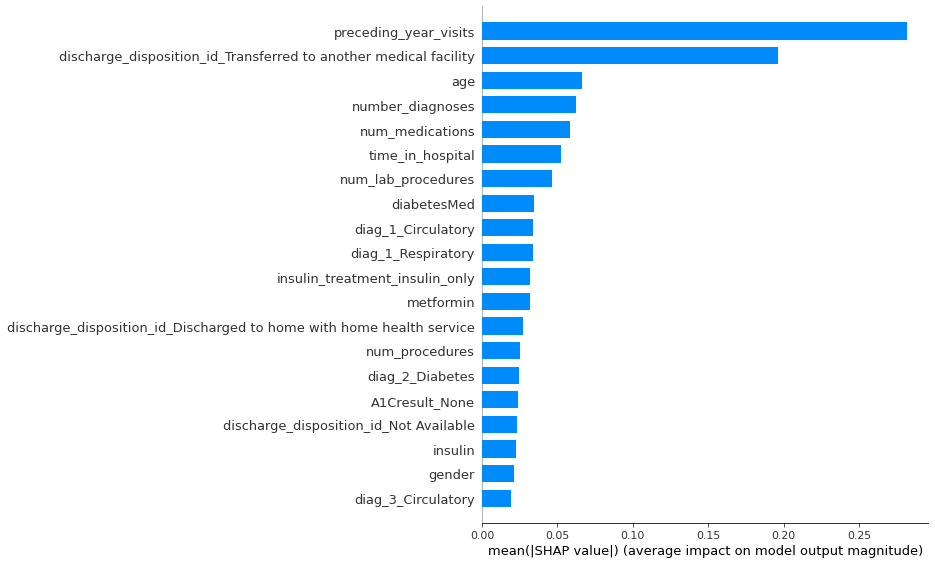

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

### SHAP Summary Plot

Besides a typical feature importance bar chart, SHAP also enables us to use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. It is interesting to note that the age and marital status feature has more total model impact than the captial gain feature, but for those samples where capital gain matters it has more impact than age or marital status. In other words, capital gain effects a few predictions by a large amount, while age or marital status effects all predictions by a smaller amount.

Note that when the scatter points don't fit on a line they pile up to show density, and the color of each point represents the feature value of that individual.

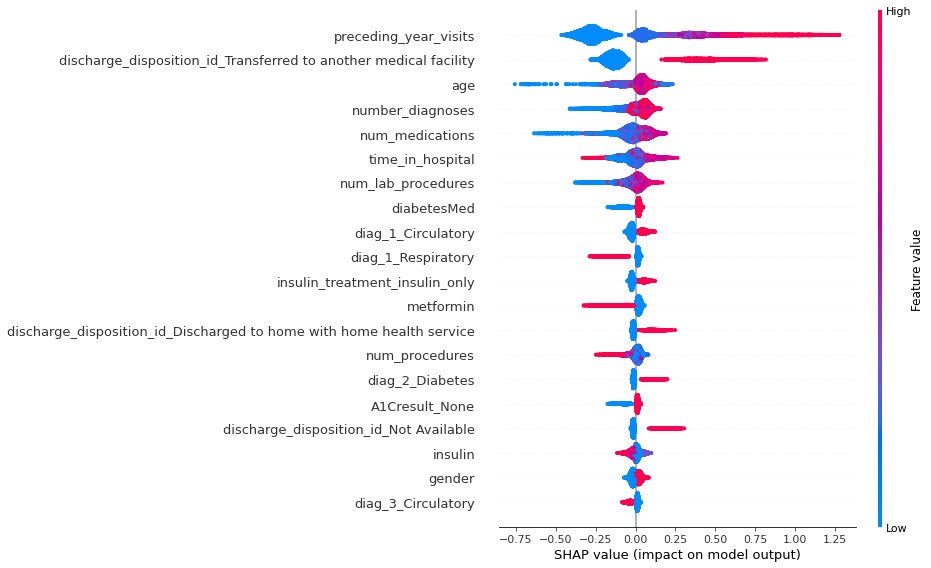

In [ ]:
shap.summary_plot(shap_values, X_test)

### SHAP Dependence Plots

SHAP dependence plots show the effect of a single (or two) feature across the whole dataset. They plot a feature's value vs. the SHAP value of that feature across many samples. SHAP dependence plots are similar to partial dependence plots, but account for the interaction effects present in the features, and are only defined in regions of the input space supported by data. The vertical dispersion of SHAP values at a single feature value is driven by interaction effects, and another feature can be chosen for coloring to highlight possible interactions.

You will also notice it's similarity with Skater's Partial Dependence Plots!

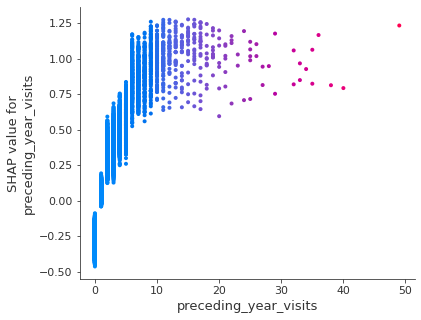

In [ ]:
shap.dependence_plot(ind='preceding_year_visits', interaction_index='preceding_year_visits',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

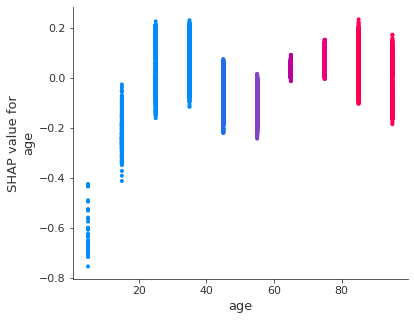

In [ ]:
shap.dependence_plot(ind='age', interaction_index='age',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

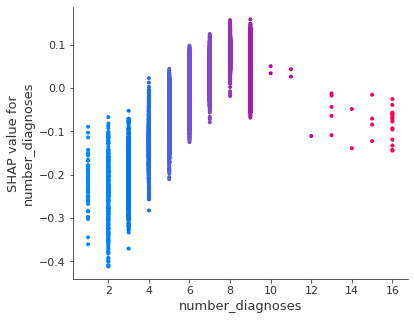

In [ ]:
shap.dependence_plot(ind='number_diagnoses', interaction_index='number_diagnoses',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

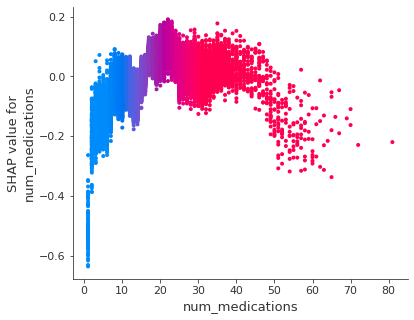

In [ ]:
shap.dependence_plot(ind='num_medications', interaction_index='num_medications',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

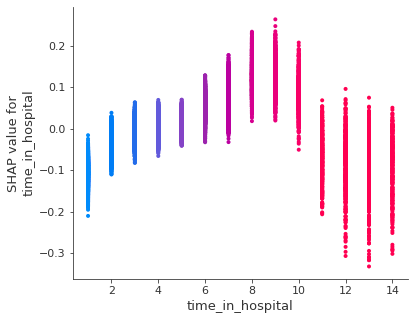

In [ ]:
shap.dependence_plot(ind='time_in_hospital', interaction_index='time_in_hospital',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

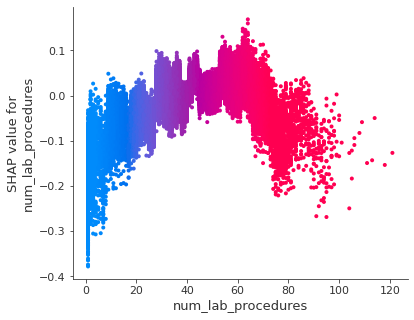

In [ ]:
shap.dependence_plot(ind='num_lab_procedures', interaction_index='num_lab_procedures',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)

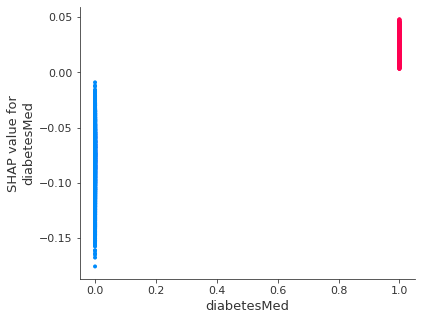

In [ ]:
shap.dependence_plot(ind='diabetesMed', interaction_index='diabetesMed',
                     shap_values=shap_values, 
                     features=X_test,  
                     display_features=X_test)